## Section 4: Cluster Analysis and Visualization

In [1]:
import pandas as pd 


In [3]:
df = pd.read_csv("combined_masked_processed_clustered.csv")

In [4]:
gdf_on_land = df

In [9]:
gdf_on_land = gdf_on_land.drop("Unnamed: 0", axis=1)

In [12]:
# Select features for clustering, which excludes 'lat', 'lon', 'decade', and cluster label columns
feature_columns = [col for col in gdf_on_land.columns if col not in ['lat', 'lon', 'decade'] and 'k_cluster' not in col and '1' not in col]

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

cluster = 'k_cluster_3'
cluster_counts = gdf_on_land[cluster].value_counts()
print("Cluster Distribution:\n", cluster_counts)

Cluster Distribution:
 2    1973108
0    1865072
1    1831713
Name: k_cluster_3, dtype: int64


### 4.1: Calculate Cluster Means
In this section, the mean (or median) values for each cluster are computed based on specified feature columns (`feature_columns`). The resulting `cluster_means` DataFrame provides insights into the central tendencies of features within each cluster.

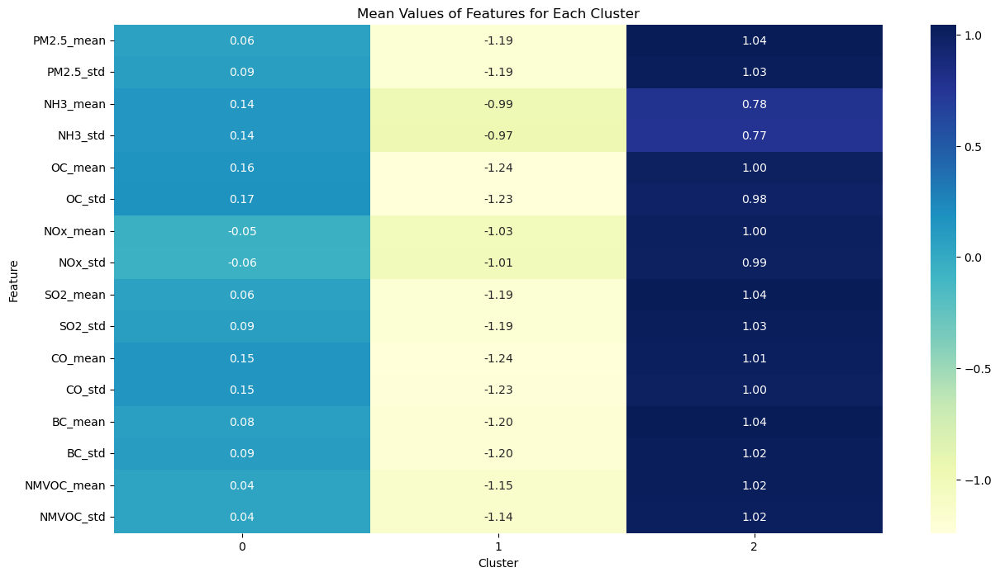

In [17]:
# Calculate the mean (or median) for each cluster
cluster_means = gdf_on_land.groupby(cluster)[feature_columns].mean()

# 3. Visualizing Feature Means/Medians for Each Cluster
# For better visualization, you might want to transpose the DataFrame
plt.figure(figsize=(15, 8))
sns.heatmap(cluster_means.T, annot=True, fmt=".2f", cmap="YlGnBu")
plt.title('Mean Values of Features for Each Cluster')
plt.xlabel('Cluster')
plt.ylabel('Feature')
plt.show()

#### To enhance interpretability, the clusters are re-labeled such that the 0 cluster signifies low pollution, and the cluster numbering ascends to denote increasing levels of pollution. Consequently, higher cluster numbers correspond to higher pollution levels.



In [22]:
# Swapping 0s and 1s
gdf_on_land[cluster] = gdf_on_land[cluster].map({0: 1, 1: 0, 2: 2})

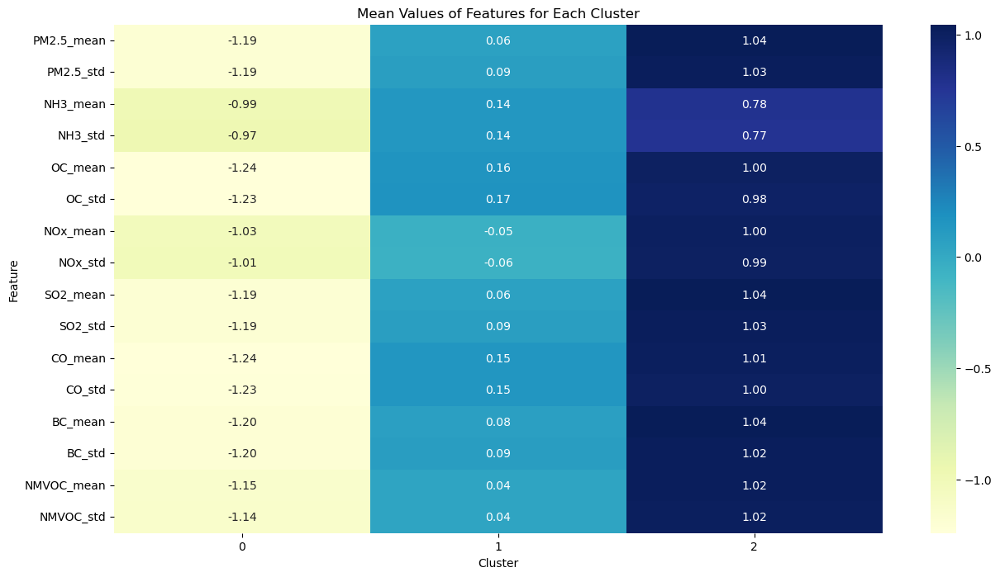

In [23]:
# Calculate the mean (or median) for each cluster
cluster_means = gdf_on_land.groupby(cluster)[feature_columns].mean()

# 3. Visualizing Feature Means/Medians for Each Cluster
# For better visualization, you might want to transpose the DataFrame
plt.figure(figsize=(15, 8))
sns.heatmap(cluster_means.T, annot=True, fmt=".2f", cmap="YlGnBu")
plt.title('Mean Values of Features for Each Cluster')
plt.xlabel('Cluster')
plt.ylabel('Feature')
plt.show()

In [24]:
cluster = 'k_cluster_4'

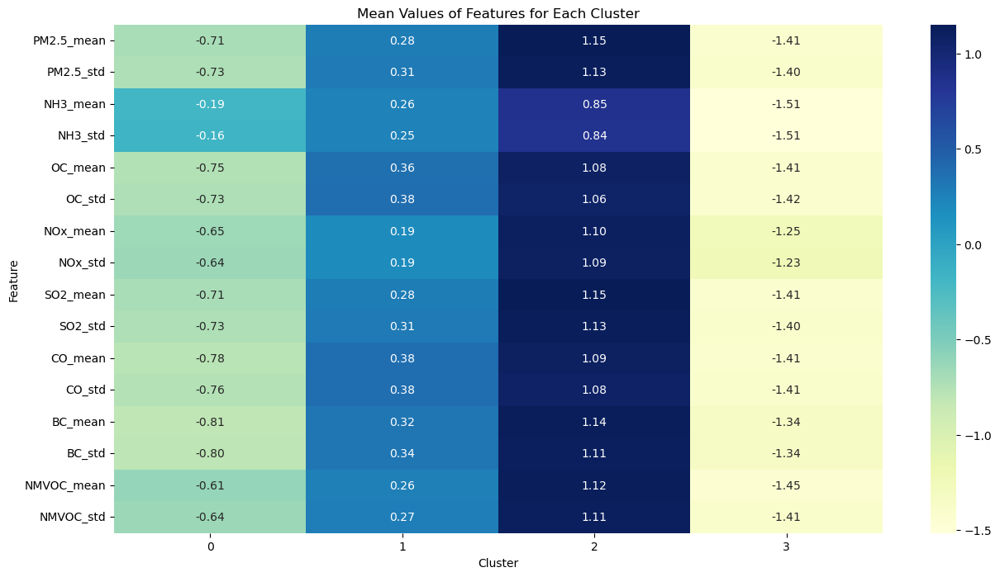

In [25]:
# Calculate the mean (or median) for each cluster
cluster_means = gdf_on_land.groupby(cluster)[feature_columns].mean()

# 3. Visualizing Feature Means/Medians for Each Cluster
# For better visualization, you might want to transpose the DataFrame
plt.figure(figsize=(15, 8))
sns.heatmap(cluster_means.T, annot=True, fmt=".2f", cmap="YlGnBu")
plt.title('Mean Values of Features for Each Cluster')
plt.xlabel('Cluster')
plt.ylabel('Feature')
plt.show()

In [28]:
# Swapping 0s and 1s
gdf_on_land[cluster] = gdf_on_land[cluster].map({0: 2, 1: 3, 2: 0, 3: 1})

In [83]:
def mean_heat(gdf_on_land, feature_columns, cluster):
    # Calculate the mean for each cluster
    cluster_means = gdf_on_land.groupby(cluster)[feature_columns].mean()
    
    # Visualizing Feature Means for Each Cluster
    plt.figure(figsize=(15, 8))
    sns.heatmap(cluster_means.T, annot=True, fmt=".6f", cmap="YlGnBu")  # Four decimal places
    plt.title('Mean Values of Features for Each Cluster')
    plt.xlabel('Cluster')
    plt.ylabel('Feature')
    plt.show()

def std_heat(gdf_on_land, feature_columns, cluster):
    # Calculate the standard deviation for each cluster
    cluster_means = gdf_on_land.groupby(cluster)[feature_columns].std()
    
    # Visualizing Feature STD for Each Cluster
    plt.figure(figsize=(15, 8))
    sns.heatmap(cluster_means.T, annot=True, fmt=".6f", cmap="YlGnBu")  # Four decimal places
    plt.title('STD Values of Features for Each Cluster')
    plt.xlabel('Cluster')
    plt.ylabel('Feature')
    plt.show()


In [30]:
gdf_on_land.to_csv("Final_df_with_swap.csv")

In [33]:
cluster_cols = gdf_on_land[['lat', 'lon', 'decade', 'k_cluster_3', 'k_cluster_4']]

In [31]:
gdf_on_land.head()

,lat,lon,decade,PM2.5_mean,PM2.5_std,NH3_mean,NH3_std,OC_mean,OC_std,PM10_mean,...,BC_mean,BC_std,NMVOC_mean,NMVOC_std,k_cluster_2,k_cluster_3,k_cluster_4,k_cluster_5,k_cluster_6,k_cluster_7
0,-89.8,-161.8,2010,-2.222735,-1.632947,-5.130910,-4.463625,-2.022822,-1.605288,-2.331284,...,-1.969521,-1.480372,-2.977527,-2.405903,0,0,0,2,1,1
1,-89.7,-161.8,2010,-1.944497,-1.153968,-4.833146,-3.940369,-1.794327,-1.200793,-2.054408,...,-1.706638,-1.019656,-2.695384,-1.904881,0,0,0,2,1,1
2,-89.6,-161.8,2010,-1.798149,-1.030110,-4.676805,-3.804313,-1.674140,-1.096193,-1.908776,...,-1.568361,-0.900522,-2.547086,-1.775270,0,0,0,2,1,1
3,-89.5,-161.8,2010,-1.901216,-1.240182,-4.787289,-4.032689,-1.758783,-1.273605,-2.011338,...,-1.665742,-1.102588,-2.651542,-1.993601,0,0,0,2,1,1
4,-89.4,-161.8,2010,-1.982719,-1.257374,-4.873671,-4.052016,-1.825717,-1.288122,-2.092442,...,-1.742750,-1.119121,-2.733617,-2.011661,0,0,0,2,1,1


In [34]:
df = pd.read_csv("combined_masked_unprocessed.csv")

In [35]:
merged_df = pd.merge(df, cluster_cols, on=['lat', 'lon', 'decade'], how='inner')

In [36]:
merged_df.head()

,Unnamed: 0,lat,lon,decade,PM2.5_mean,PM2.5_std,NH3_mean,NH3_std,OC_mean,OC_std,...,BC_std,NMVOC_mean,NMVOC_std,geometry,index_right,featurecla,scalerank,min_zoom,k_cluster_3,k_cluster_4
0,15,-89.8,-161.8,2010,0.000326,0.000201,2.965265e-07,1.827058e-07,0.000033,0.000020,...,0.000040,0.000127,0.000078,POINT (-161.8 -89.8),7,Land,0,0.0,0,0
1,22,-89.7,-161.8,2010,0.000835,0.001054,7.654472e-07,9.674391e-07,0.000083,0.000105,...,0.000211,0.000328,0.000415,POINT (-161.8 -89.7),7,Land,0,0.0,0,0
2,34,-89.6,-161.8,2010,0.001368,0.001617,1.258667e-06,1.491080e-06,0.000137,0.000162,...,0.000323,0.000540,0.000639,POINT (-161.8 -89.6),7,Land,0,0.0,0,0
3,48,-89.5,-161.8,2010,0.000966,0.000782,8.856900e-07,7.212631e-07,0.000097,0.000078,...,0.000156,0.000380,0.000308,POINT (-161.8 -89.5),7,Land,0,0.0,0,0
4,55,-89.4,-161.8,2010,0.000734,0.000737,6.728345e-07,6.782505e-07,0.000073,0.000074,...,0.000147,0.000289,0.000290,POINT (-161.8 -89.4),7,Land,0,0.0,0,0


### 4.2: Mean Heatmap for Unprocessed Data

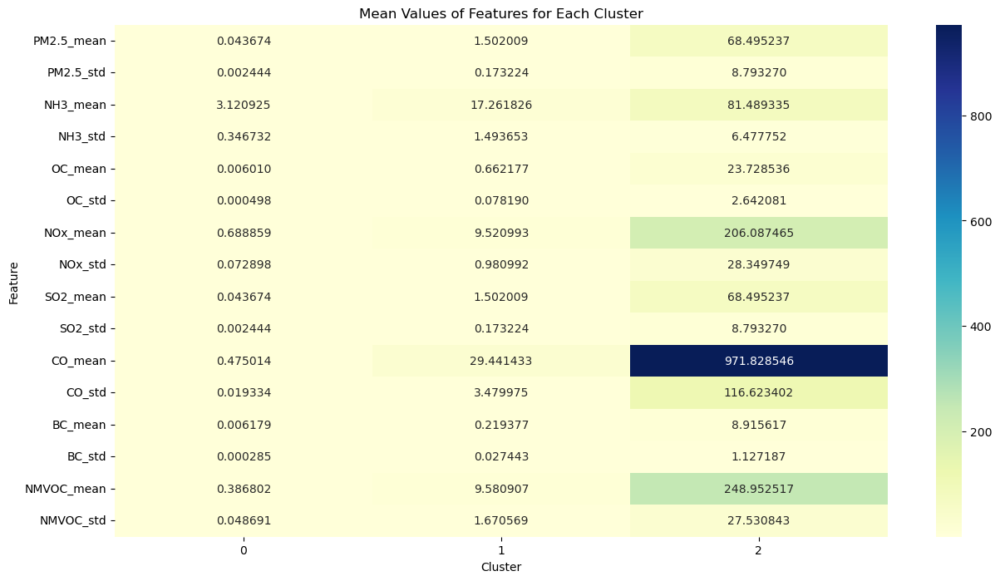

In [84]:
mean_heat(merged_df, feature_columns, "k_cluster_3")

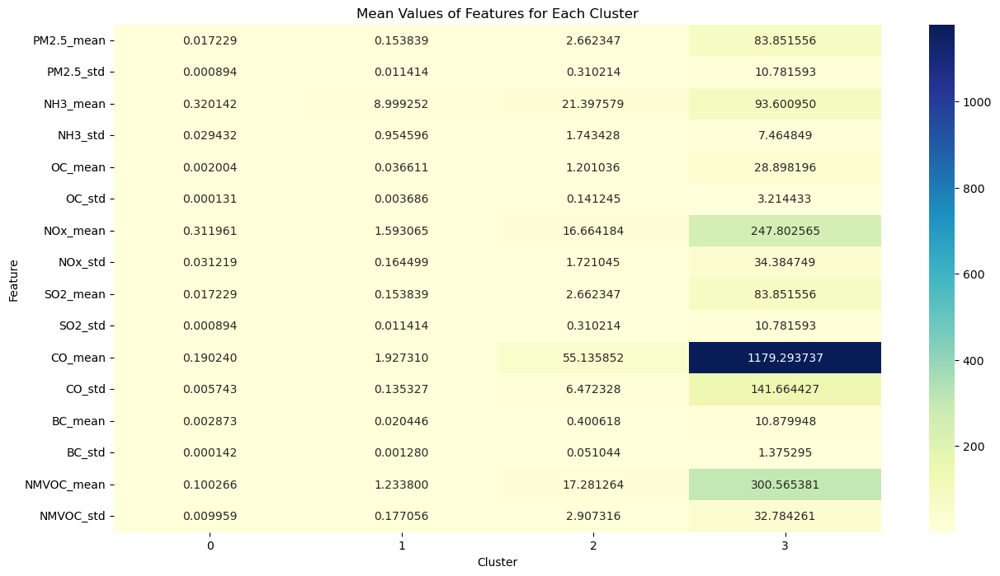

In [85]:
mean_heat(merged_df, feature_columns, "k_cluster_4")

## Section 5: Cluster Trajectory

### 5.1: Cluster Occurrences Over Decades (k = 3)

In this section, the occurrences of clusters over different decades are analyzed and visualized as a line graph with percentages. The dataset (`gdf_on_land`) is grouped by 'decade' and 'k_cluster_3', and the number of occurrences is counted for each combination. The resulting percentages illustrate the distribution of clusters over time.


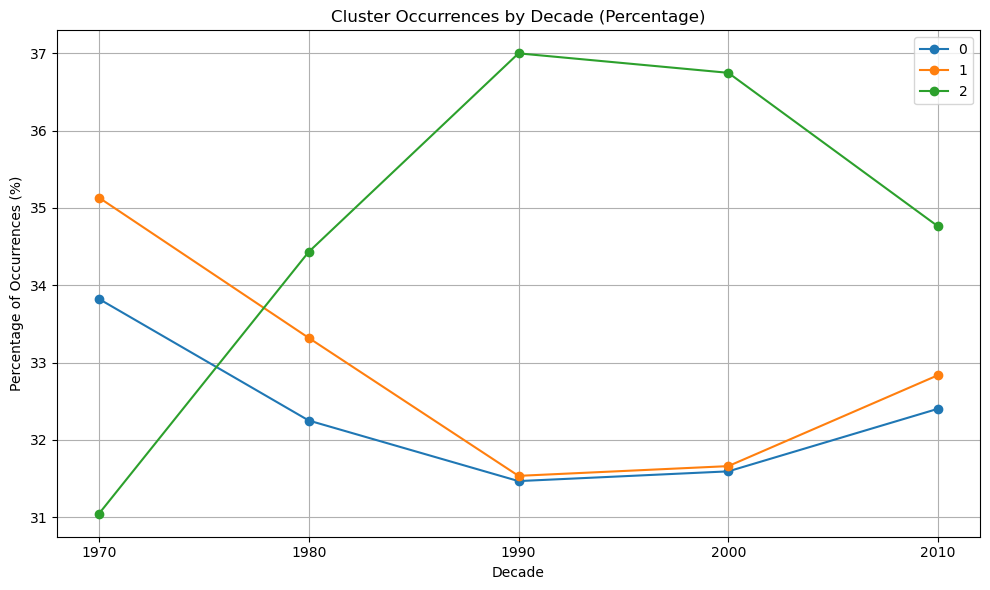

In [43]:
import matplotlib.pyplot as plt

# Group by 'decade' and 'cluster', then count the number of occurrences
grouped = gdf_on_land.groupby(['decade', 'k_cluster_3']).size().unstack(fill_value=0)

grouped_percentage = grouped.div(grouped.sum(axis=1), axis=0) * 100

# Plotting the line graph with percentages
fig, ax = plt.subplots(figsize=(10, 6))

for cluster in grouped_percentage.columns:
    ax.plot(grouped_percentage.index, grouped_percentage[cluster], label=cluster, marker='o')

ax.set_xlabel('Decade')
ax.set_ylabel('Percentage of Occurrences (%)')
ax.set_title('Cluster Occurrences by Decade (Percentage)')
ax.legend()

plt.xticks(grouped_percentage.index)
plt.grid(True)
plt.tight_layout()
plt.show()

### 5.2: Cluster Occurrences Over Decades (k = 4)

In this section, the occurrences of clusters over different decades are analyzed and visualized as a line graph with percentages. The dataset (`gdf_on_land`) is grouped by 'decade' and 'k_cluster_4', and the number of occurrences is counted for each combination. The resulting percentages illustrate the distribution of clusters over time for a k value of 4.


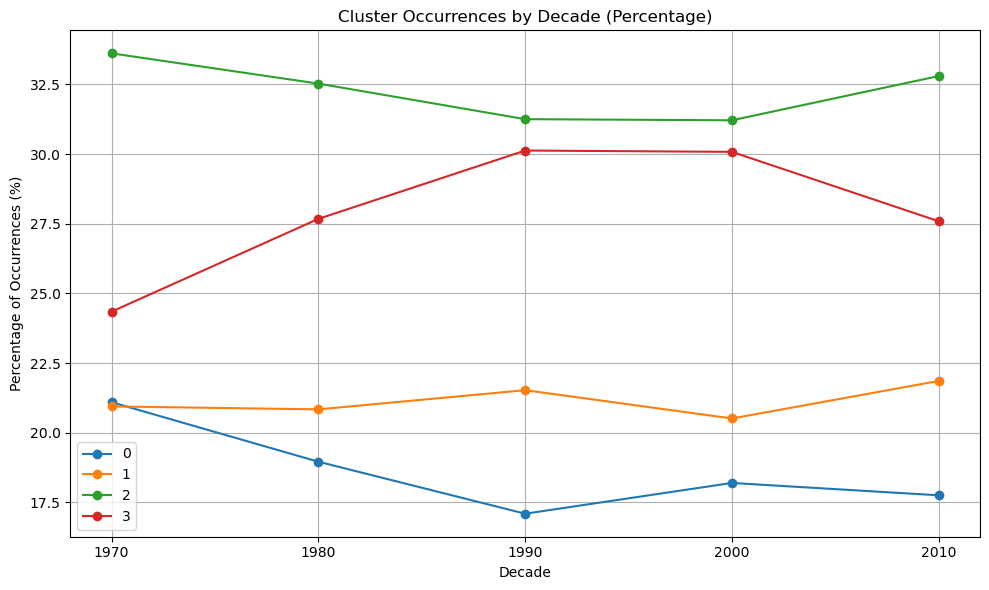

In [44]:
import matplotlib.pyplot as plt

# Group by 'decade' and 'cluster', then count the number of occurrences
grouped = gdf_on_land.groupby(['decade', 'k_cluster_4']).size().unstack(fill_value=0)

grouped_percentage = grouped.div(grouped.sum(axis=1), axis=0) * 100

# Plotting the line graph with percentages
fig, ax = plt.subplots(figsize=(10, 6))

for cluster in grouped_percentage.columns:
    ax.plot(grouped_percentage.index, grouped_percentage[cluster], label=cluster, marker='o')

ax.set_xlabel('Decade')
ax.set_ylabel('Percentage of Occurrences (%)')
ax.set_title('Cluster Occurrences by Decade (Percentage)')
ax.legend()

plt.xticks(grouped_percentage.index)
plt.grid(True)
plt.tight_layout()
plt.show()

## Section 6: Clustered Maps Over Decades

### 6.1: Cluster Distribution

In this section, maps are generated to visualize the clustering results over different decades. Each map represents the spatial distribution of clusters ('k_cluster_3' and 'k_cluster_4') for a specific decade.

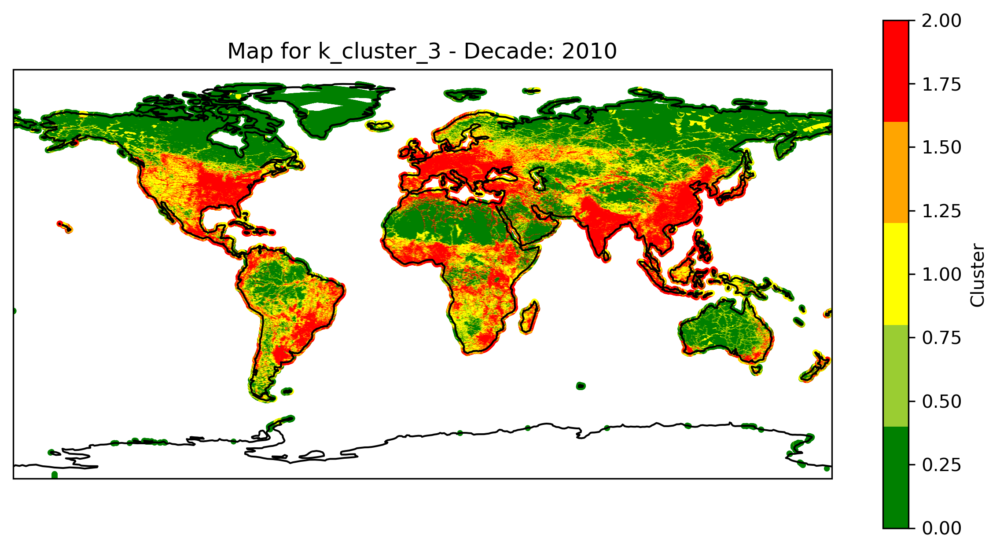

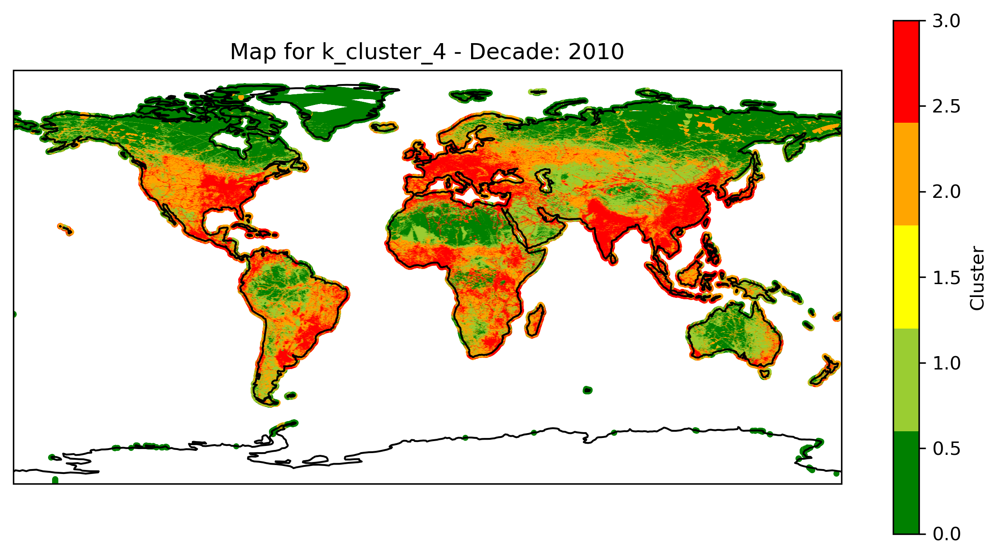

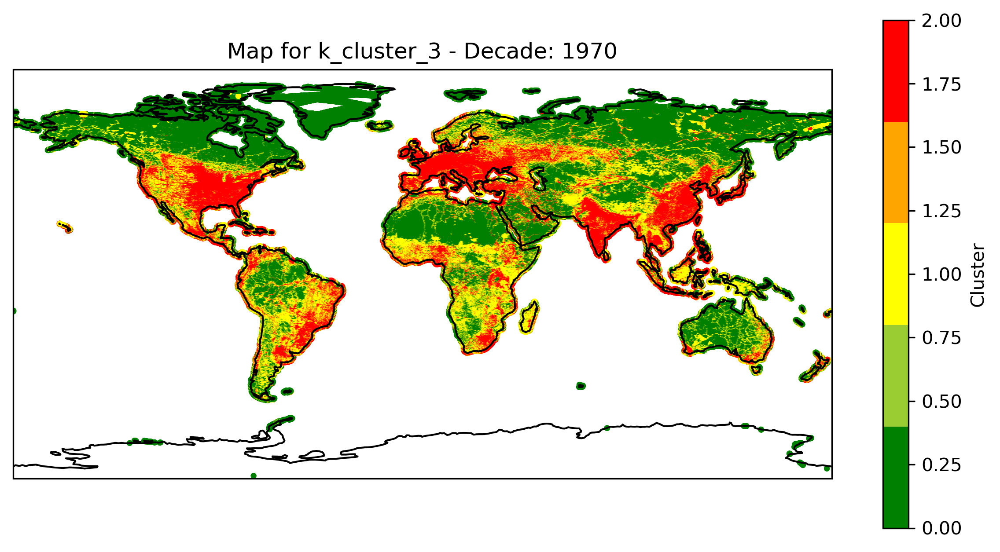

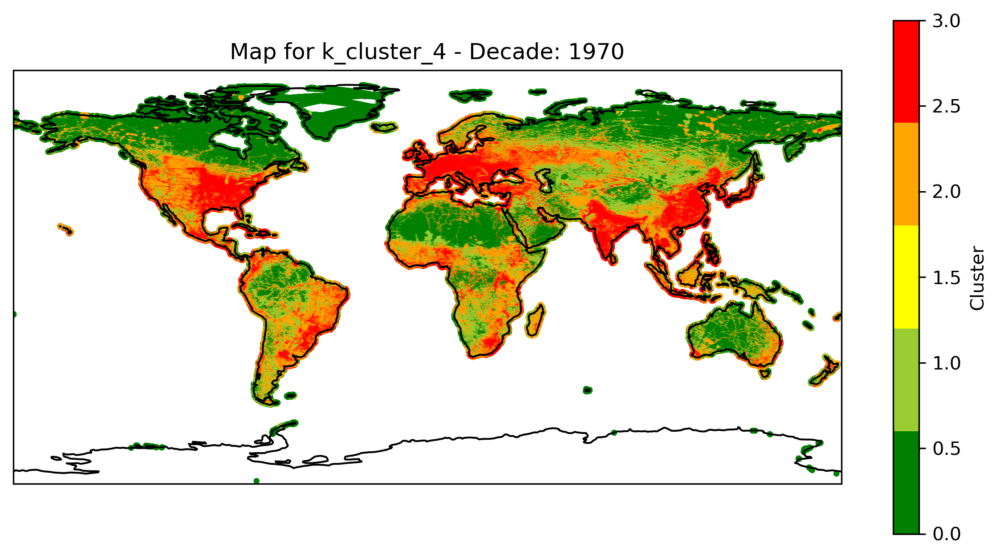

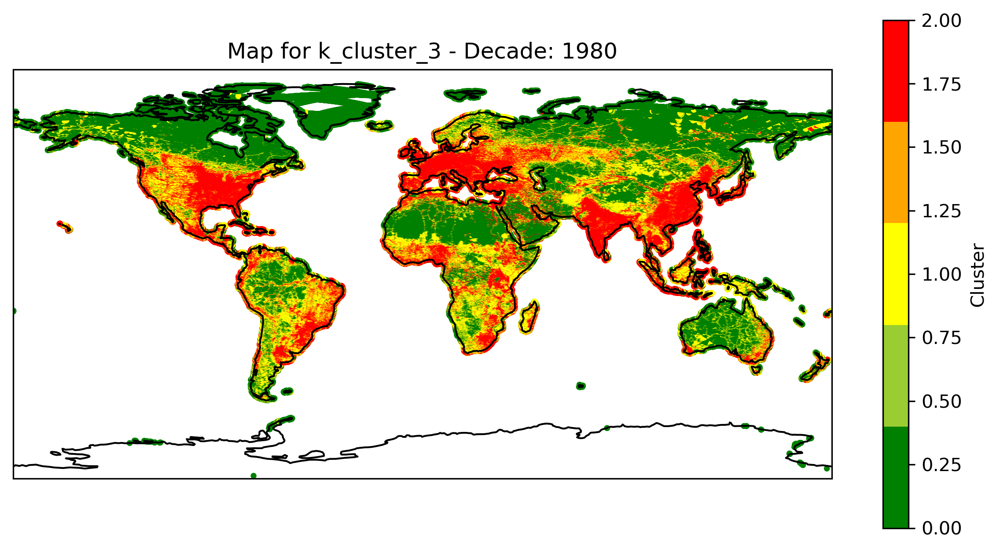

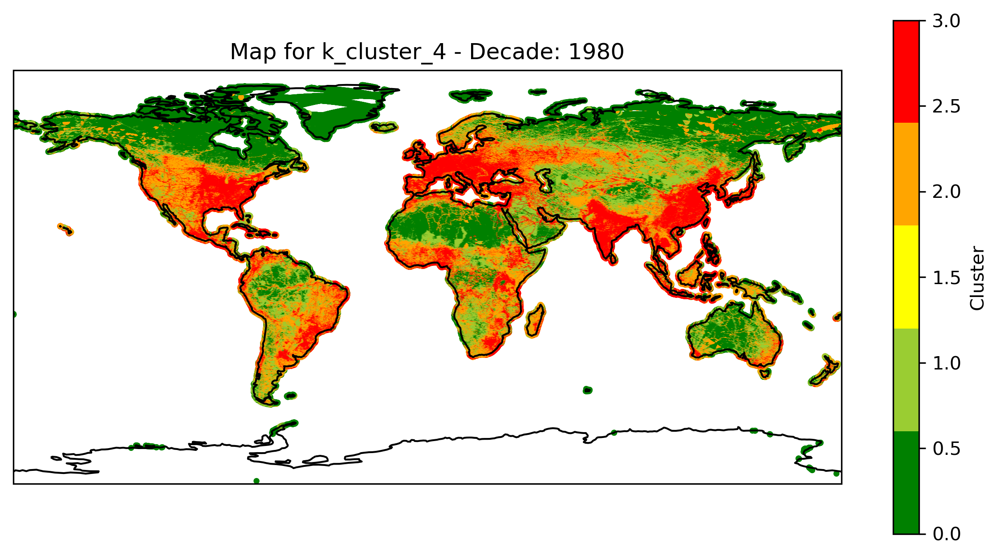

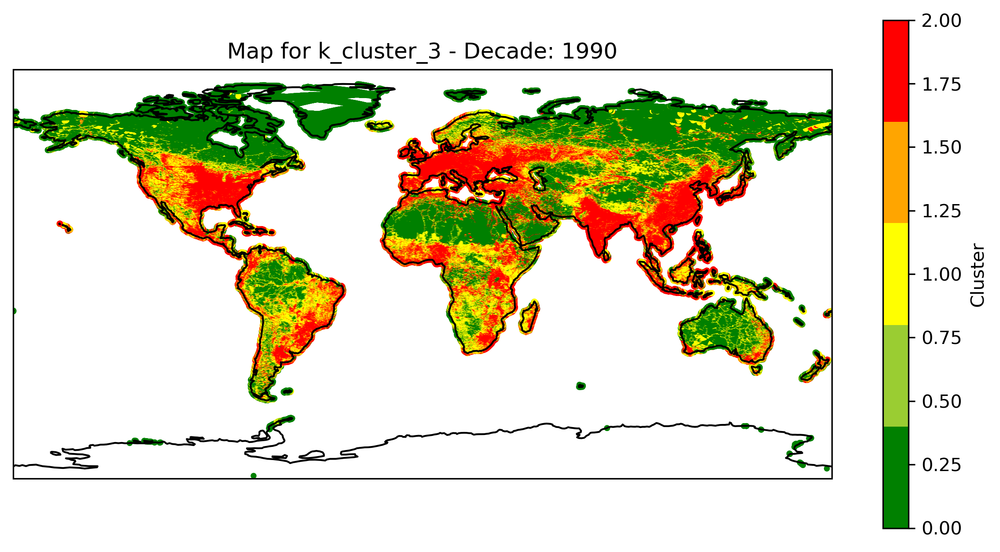

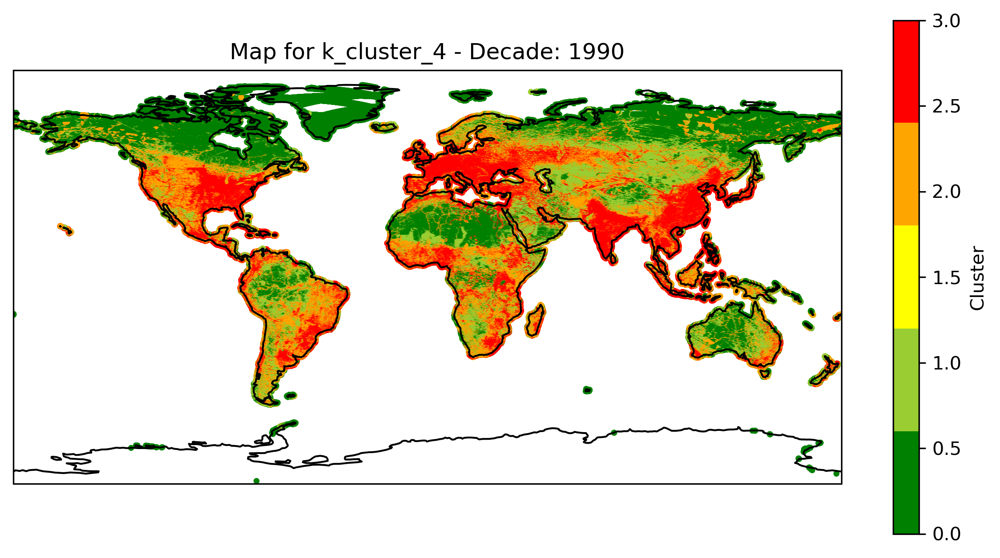

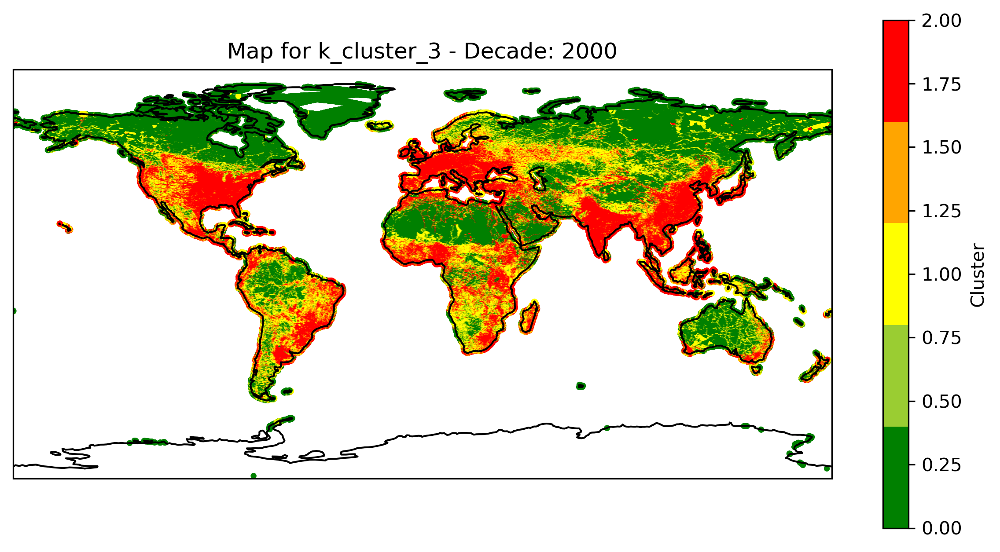

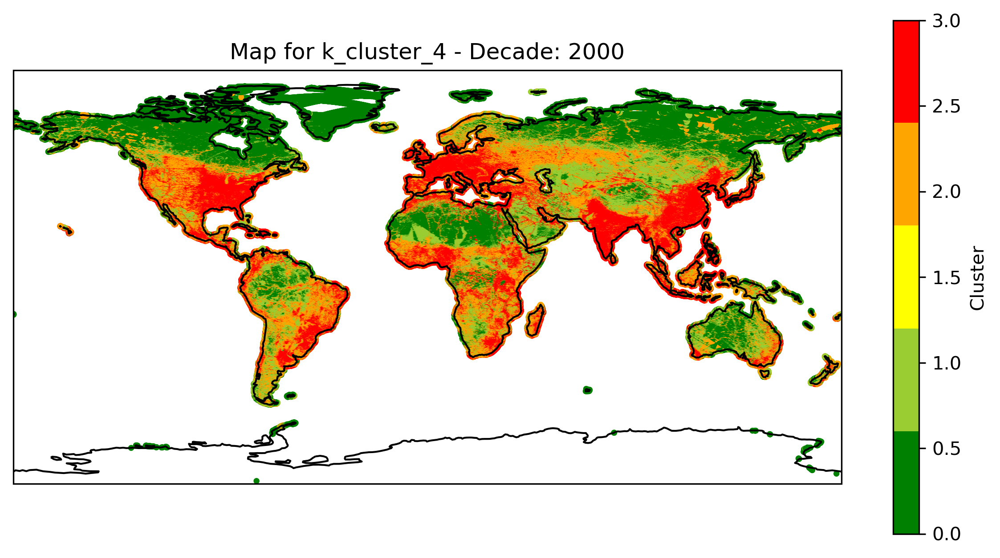

In [47]:
import os
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import pandas as pd
import matplotlib.colors as mcolors

# Replace this with your actual DataFrame 'gdf_on_land'
# Ensure it has columns 'lat', 'lon', 'decade', 'k_cluster_3', 'k_cluster_4'

# Get the unique decades
unique_decades = gdf_on_land['decade'].unique()

# Check if the 'maps' directory exists, if not, create it
if not os.path.exists('maps_1'):
    os.makedirs('maps_1')

# Define the colors - you can choose your own colors
colors = ["green", "yellowgreen", "yellow", "orange", "red"]

# Create a LinearSegmentedColormap
cmap = mcolors.LinearSegmentedColormap.from_list("custom_pollution_map", colors, N=5)

# Loop over each decade and cluster
for decade in unique_decades:
    for cluster in ['k_cluster_3', 'k_cluster_4']:
        # Setup the map
        fig = plt.figure(figsize=(10, 5), dpi=300)
        ax = plt.axes(projection=ccrs.PlateCarree())
        ax.coastlines()

        # Filter the DataFrame for the current decade and cluster
        df_decade_cluster = gdf_on_land[gdf_on_land['decade'] == decade]

        # Plot points with a color based on the cluster value
        scatter = ax.scatter(df_decade_cluster['lon'], df_decade_cluster['lat'],
                             c=df_decade_cluster[cluster], cmap=cmap, s=5,
                             transform=ccrs.Geodetic())

        # Add a color bar
        plt.colorbar(scatter, ax=ax, orientation='vertical', label='Cluster')

        # Set the title
        ax.set_title(f'Map for {cluster} - Decade: {decade}')

        # Save the figure
        plt.savefig(f'maps/map_{decade}_{cluster}.png', bbox_inches='tight')

        # Display the map
        plt.show()


### 6.2: Creating Animated GIFs

In this section, animated GIFs are generated to visualize the evolution of pollution clusters over the years. The GIFs represent the spatial distribution of clusters for each decade, focusing on both 'k_cluster_3' and 'k_cluster_4'.


In [76]:
import imageio

def create_gif(cluster_type, start_year, end_year, folder='maps_1'):
    images = []
    for year in range(start_year, end_year + 1, 10):  # Adjust the range if necessary
        filename = f'{folder}/map_{year}_{cluster_type}.png'
        images.append(imageio.imread(filename))
    
    # Save the GIF with a longer duration per frame
    imageio.mimsave(f'{folder}/{cluster_type}_1970_2010.gif', images, duration=1250, loop=0)  # 1 second per frame

# Create GIFs
create_gif('k_cluster_3', 1970, 2010)
create_gif('k_cluster_4', 1970, 2010)


/var/folders/11/420l4w3d6jv13qq19d9n_qsr0000gn/T/ipykernel_29552/143817786.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(filename))


In [ ]:
from IPython.display import HTML

def display_gif(gif_path):
    html = f'<img src="{gif_path}" alt="GIF" style="loop:infinite;">'
    return HTML(html)

# Display GIF for k=3 cluster
display_gif('maps_1/k_cluster_3_1970_2010.gif')

<img src="cluster3.gif" width="1000"> 

In [ ]:
# Display GIF for k=4 cluster
display_gif('maps_1/k_cluster_4_1970_2010.gif')

<img src="cluster4.gif" width="1000"> 

## Section 7: Result

The final result of our data mining project reveals significant insights into air pollution trends across various regions from 1970 to 2018. Our analysis, utilizing k-means clustering with optimal cluster numbers identified through the Elbow Method and Silhouette Scores, effectively categorized regions based on their pollution profiles. The cluster maps and heat maps generated illustrate the spatial distribution and intensity of different pollutants, indicating shifts in pollution patterns over decades. Notably, high-pollution clusters correspond to industrial and urban areas, while cleaner clusters suggest effective environmental policies or less industrial activity. The trajectory analysis further highlights the evolving nature of air pollution, providing a crucial tool for policymakers to identify and address areas with critical pollution levels.